/var/folders/c1/9w_h09rj4qq113scs543c_kr0000gn/T/ipykernel_33327/2961377466.py:18: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Data/symptom_scores_all_deepseek-v3-0324.csv')
/opt/anaconda3/lib/python3.12/site-packages/interpret/glassbox/_ebm/_ebm.py:813: UserWarning: Missing values detected. Our visualizations do not currently display missing values. To retain the glassbox nature of the model you need to either set the missing values to an extreme value like -1000 that will be visible on the graphs, or manually examine the missing value score in ebm.term_scores_[term_index][0]
  warn(


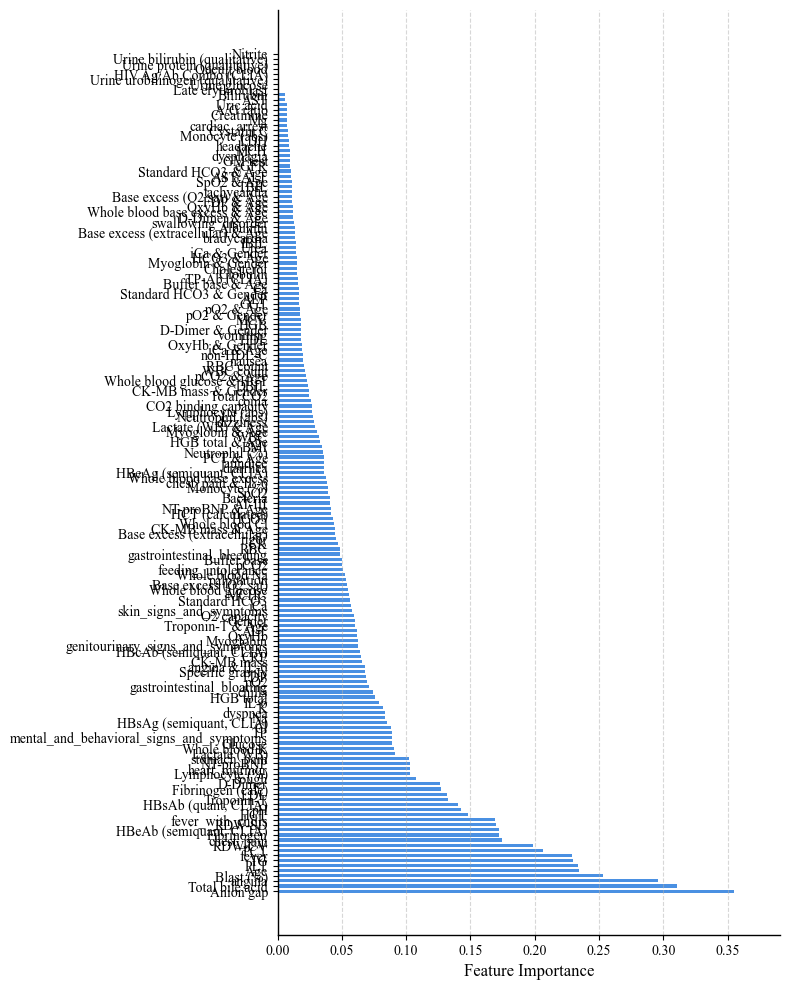

/var/folders/c1/9w_h09rj4qq113scs543c_kr0000gn/T/ipykernel_33327/2961377466.py:184: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('YlGnBu')


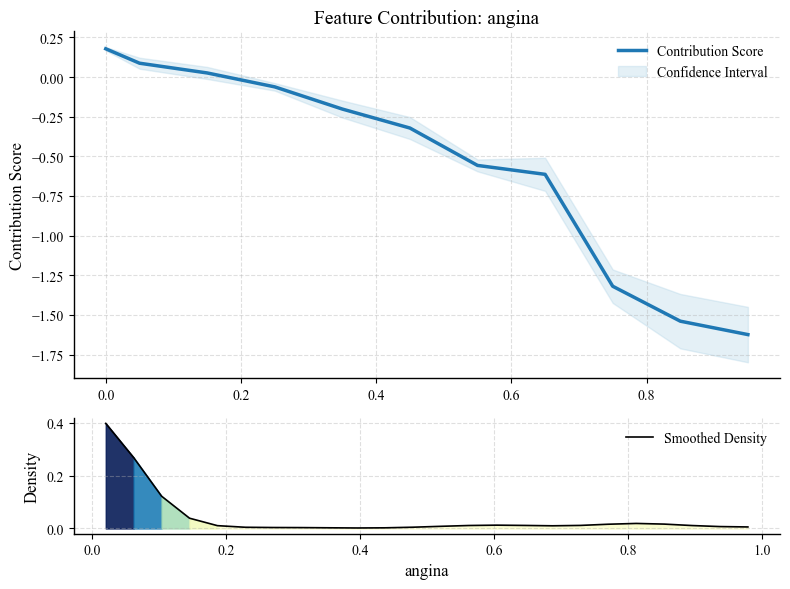

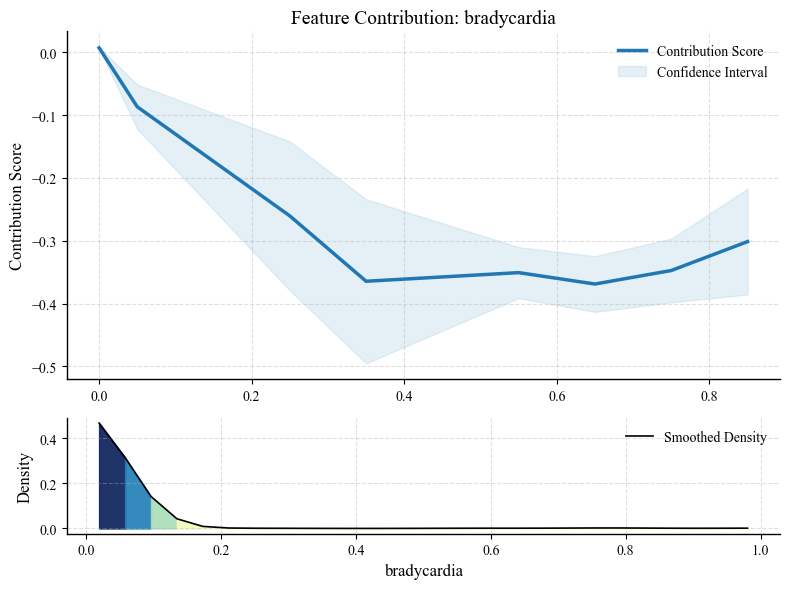

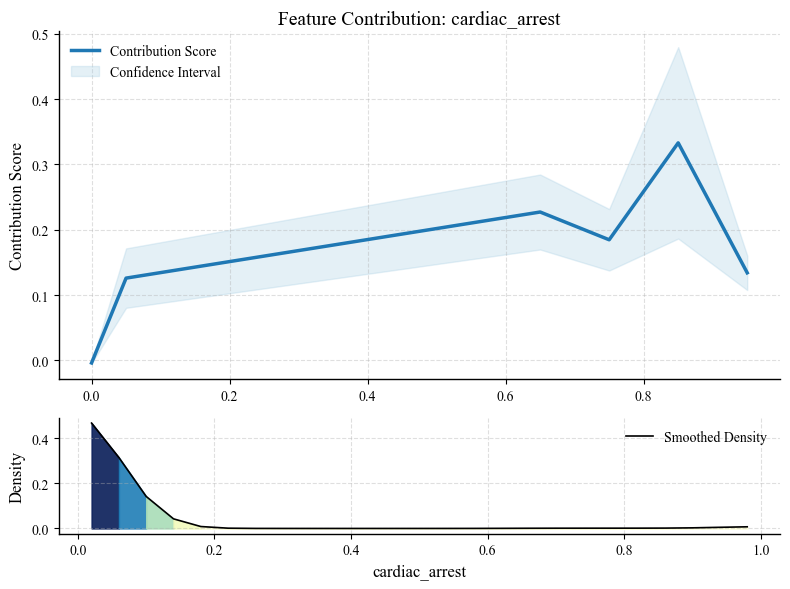

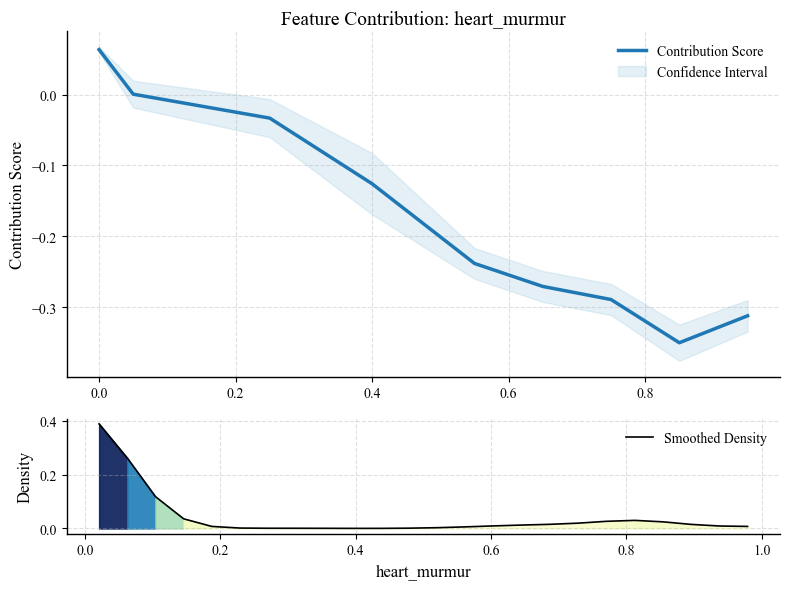

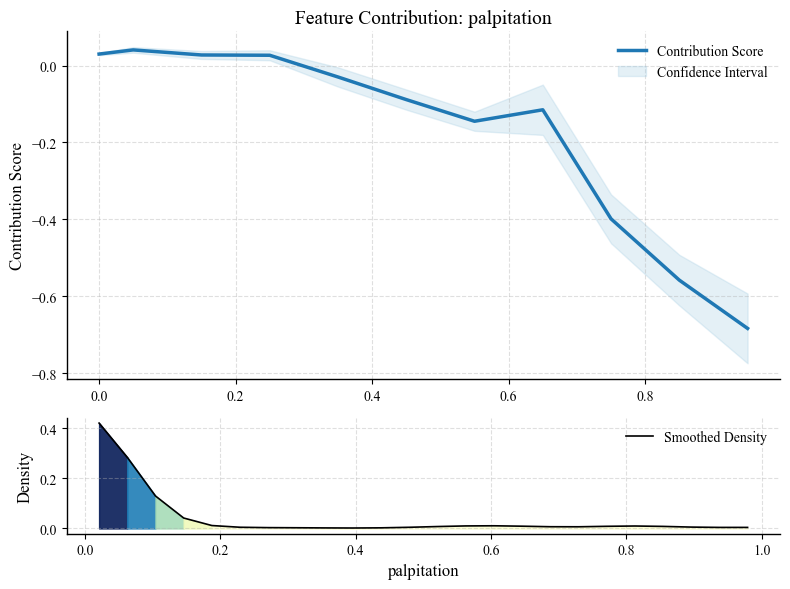

...

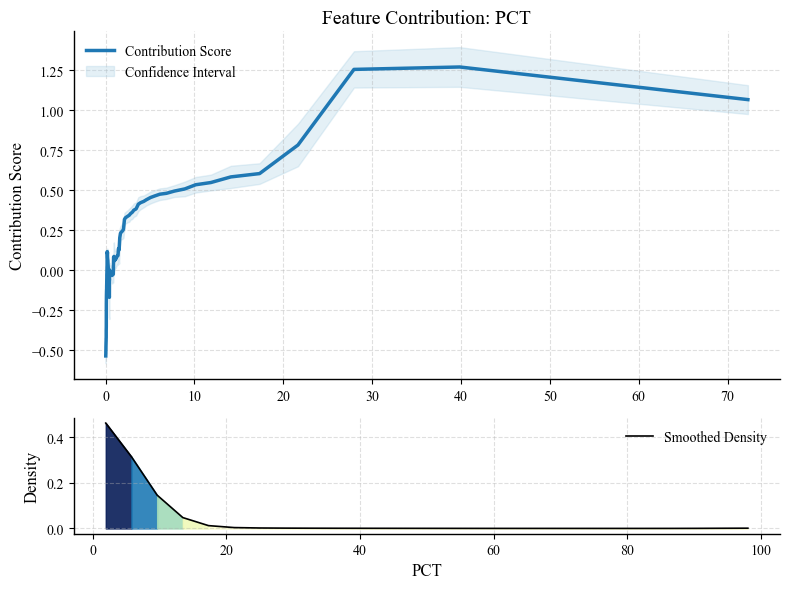

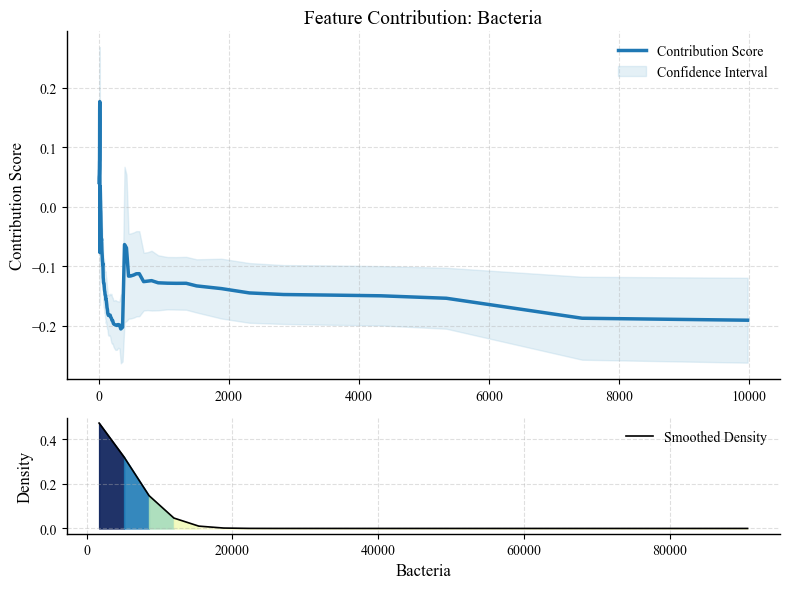

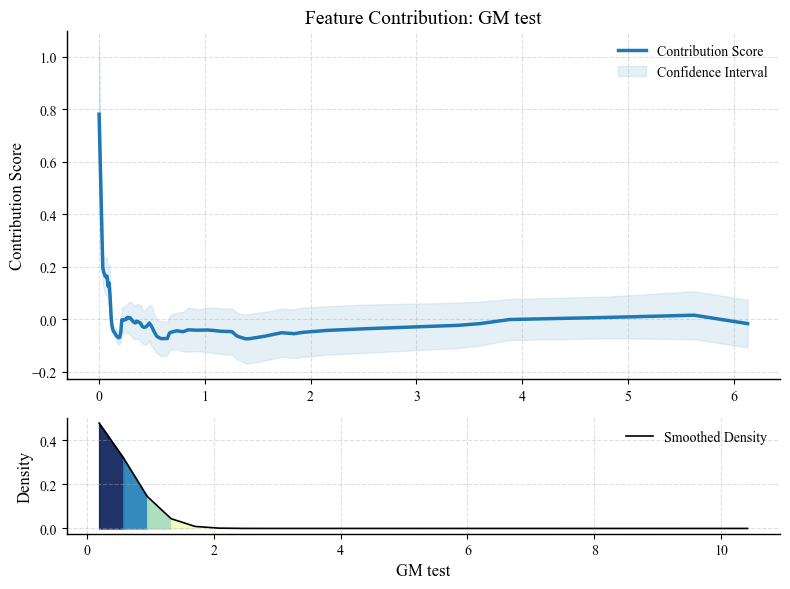

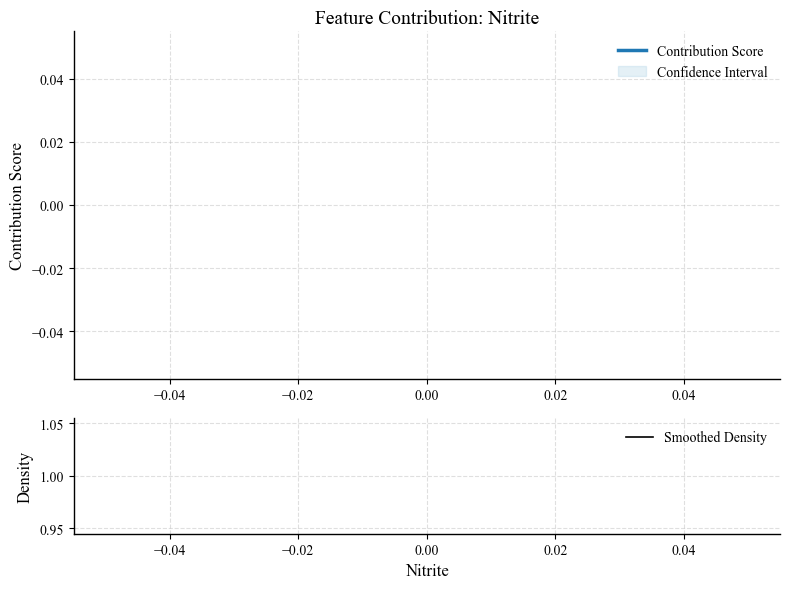

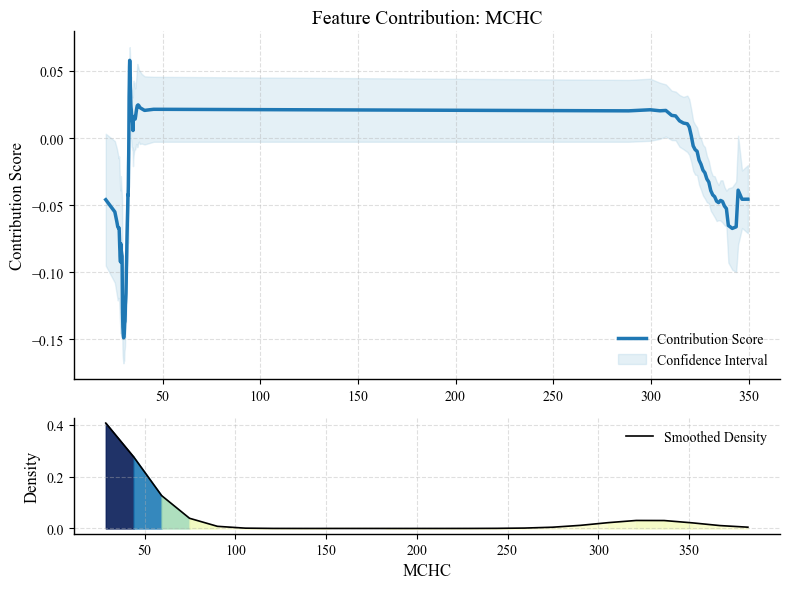

/var/folders/c1/9w_h09rj4qq113scs543c_kr0000gn/T/ipykernel_33327/2961377466.py:168: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(loc='best', frameon=False)
/var/folders/c1/9w_h09rj4qq113scs543c_kr0000gn/T/ipykernel_33327/2961377466.py:184: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('YlGnBu')


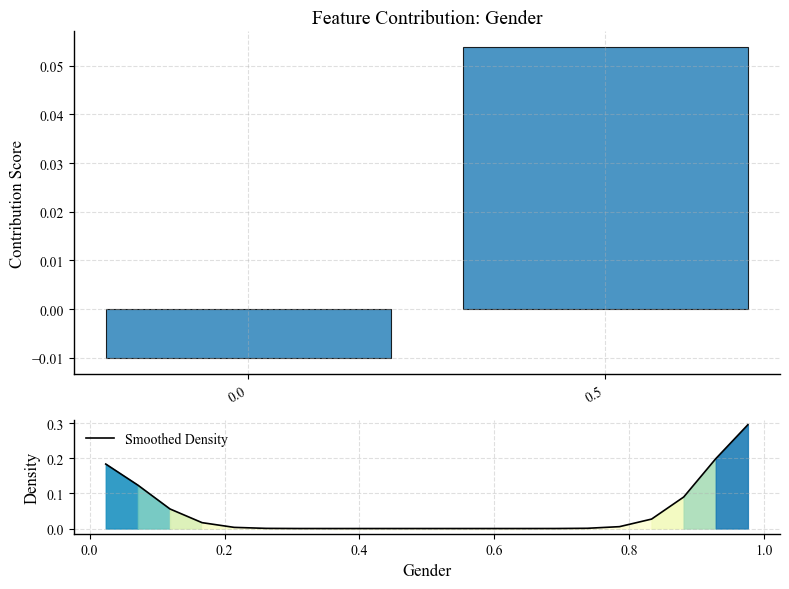

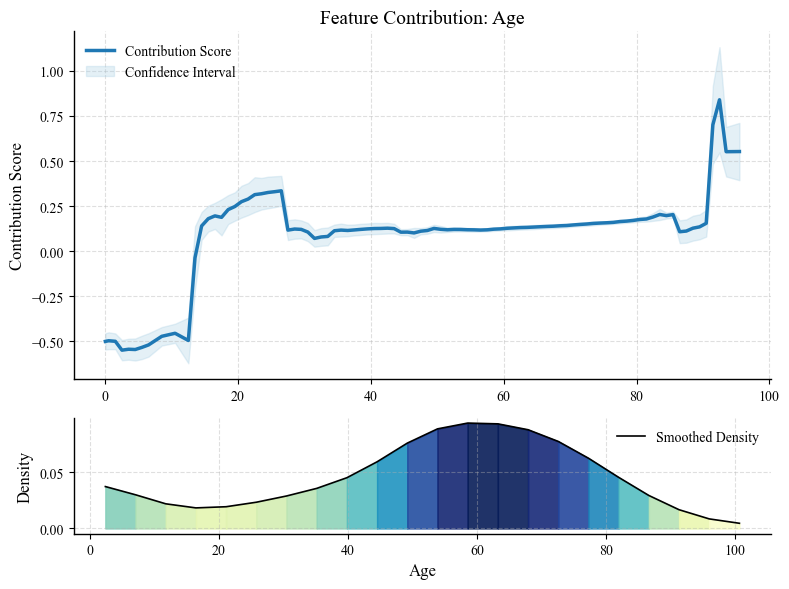

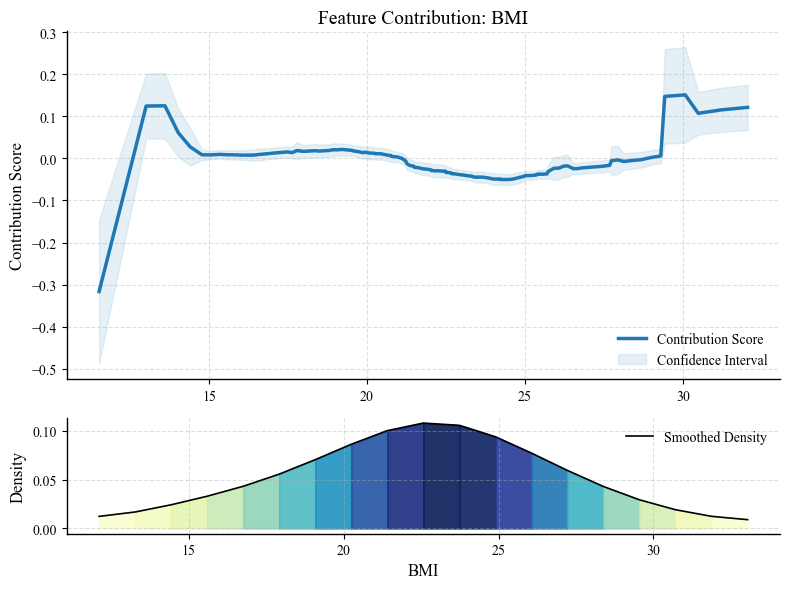

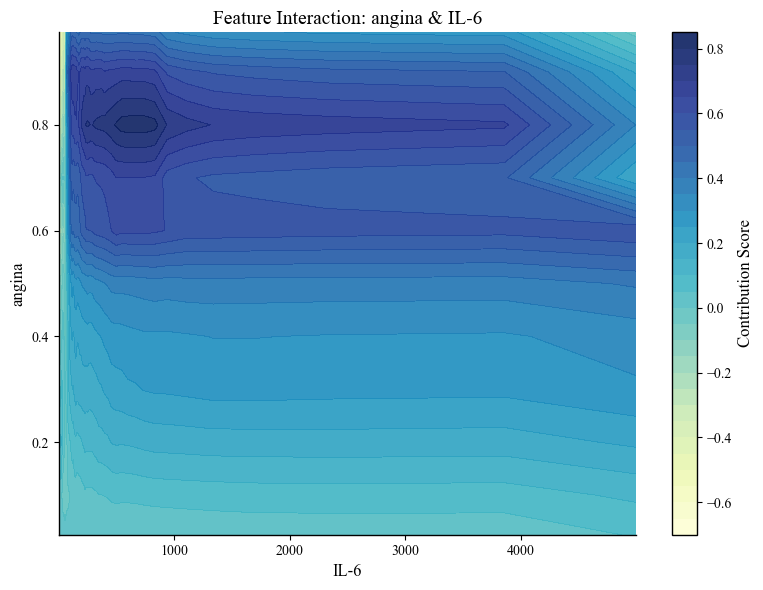

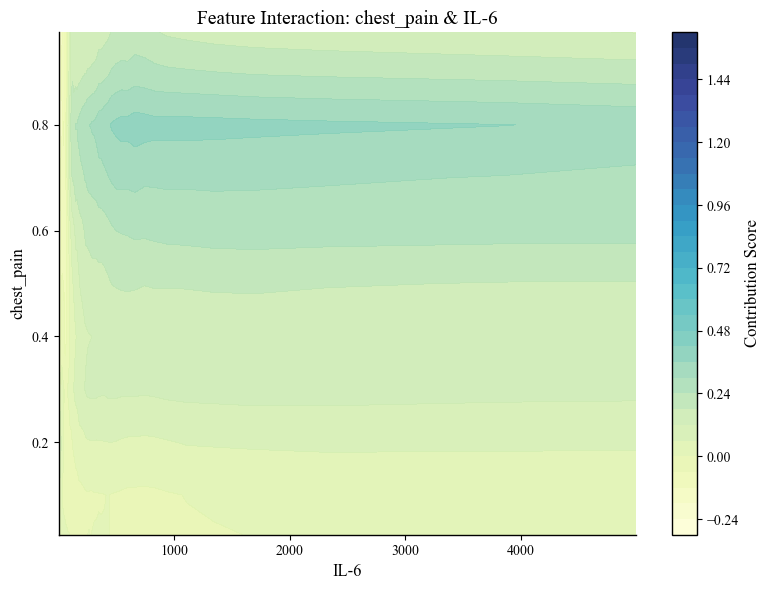

...

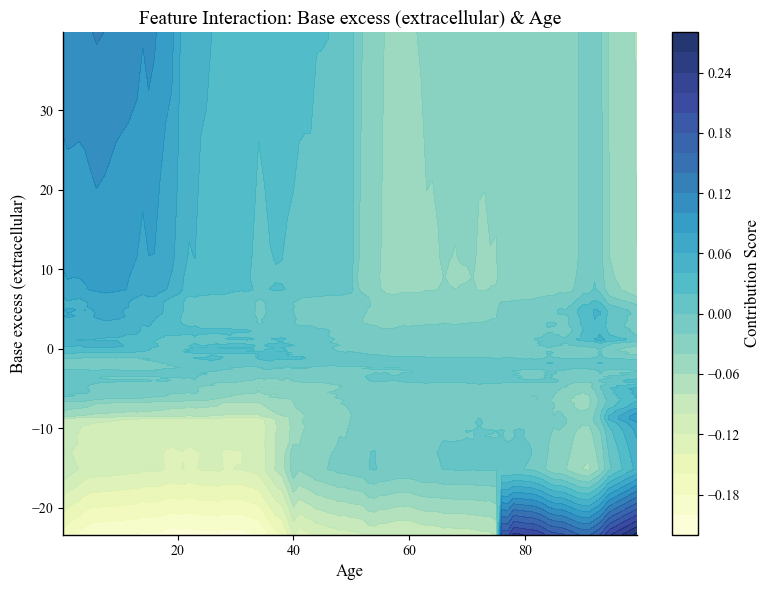

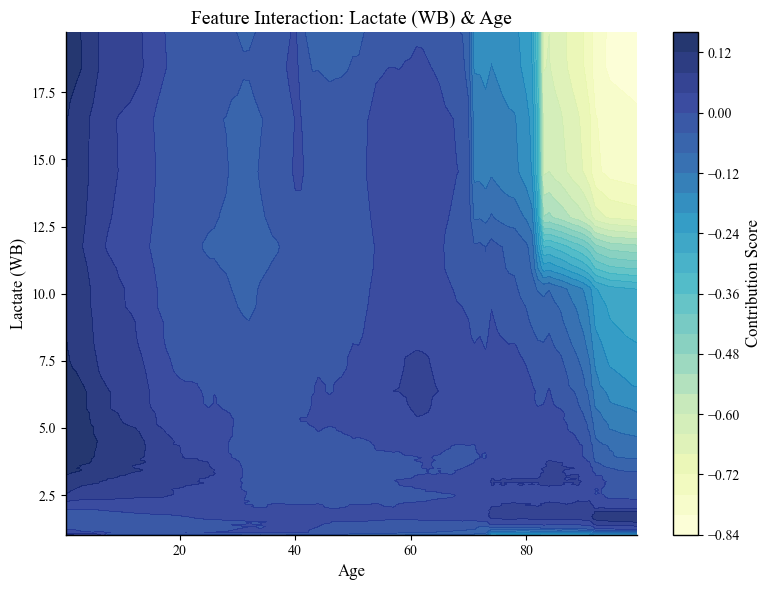

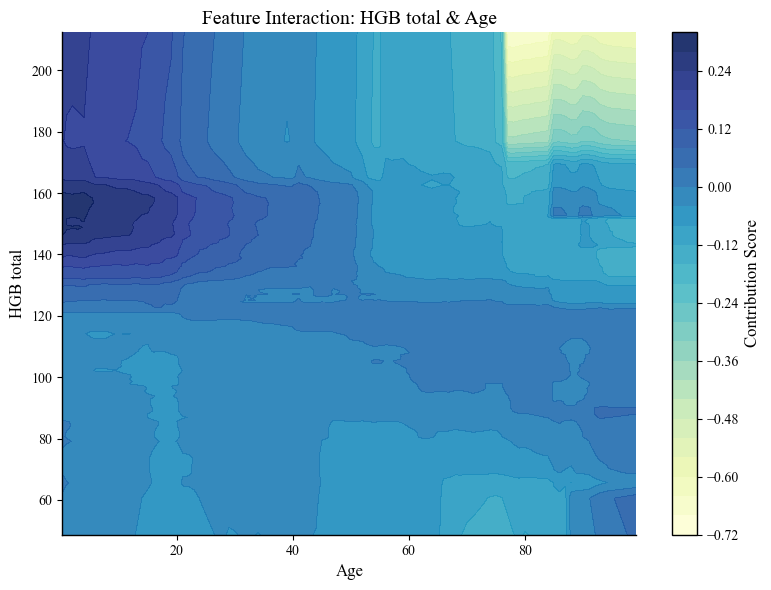

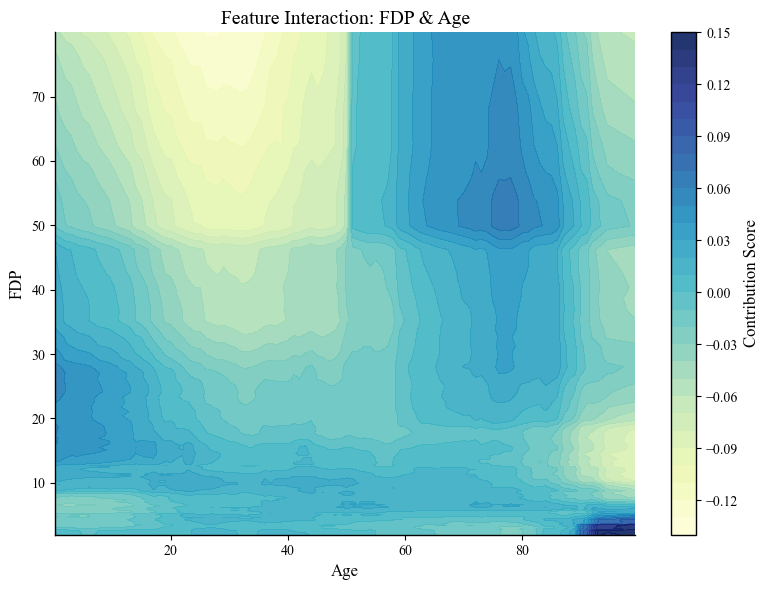

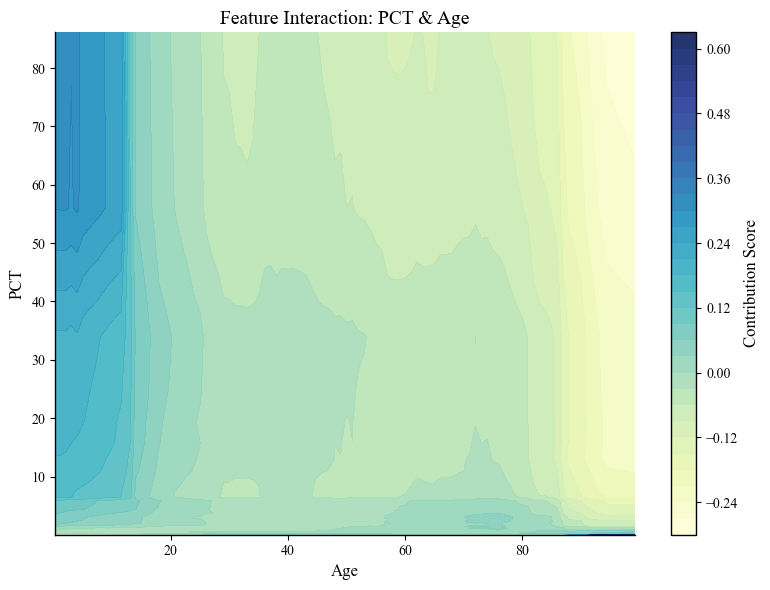

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd 
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.model_selection import train_test_split
import matplotlib as mpl
from scipy.ndimage import gaussian_filter1d
from matplotlib.cm import get_cmap
from matplotlib.colors import Normalize
# Set font to Times New Roman for publication style
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.linewidth'] = 1.0
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.direction'] = 'out'
# Fit the EBM model (if not already fitted)
df = pd.read_csv('Data/symptom_scores_all_deepseek-v3-0324.csv')
df2 = pd.read_excel('Data/ICU_BASELINE.xlsx')
df2['年龄'] = pd.to_numeric(df2['年龄'], errors='coerce')
df2['身高'] = pd.to_numeric(df2['身高'], errors='coerce')
df2['体重'] = pd.to_numeric(df2['体重'], errors='coerce')
df2['BMI'] = df2['体重'] / ((df2['身高'] / 100) ** 2)
Q1 = df2['BMI'].quantile(0.25)
Q3 = df2['BMI'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
median_bmi = df2['BMI'].median()
df2['BMI'] = df2['BMI'].apply(lambda x: median_bmi if x < lower_bound or x > upper_bound else x)
df2.rename(columns={
    '性别': 'Gender',
    '年龄': 'Age'
}, inplace=True)
# 将 Gender 列中的“男”映射为 1，“女”映射为 0
df2['Gender'] = df2['Gender'].map({'男': 1, '女': 0})
df = pd.merge(df,df2[['patient_id','Gender','Age','BMI']],on='patient_id',how='left')
y = df['label']
X = df.drop(columns=['label', 'patient_id'])

# 划分训练与测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# 创建并训练 EBM 模型
ebm = ExplainableBoostingClassifier(
    interactions=30,
    max_bins=128,
    max_interaction_bins=128,
    random_state=42
)
ebm.fit(X_train, y_train)
#EBM 最佳参数: {'interactions': 30, 'max_bins': 128, 'max_interaction_bins': 128}


ebm_global = ebm.explain_global(name='EBM')

# Extract feature names and importance scores
feature_names = ebm_global.data()['names']
importances = ebm_global.data()['scores']

# Sort features by importance
sorted_idx = np.argsort(importances)
sorted_feature_names = np.array(feature_names)[sorted_idx]
sorted_importances = np.array(importances)[sorted_idx]
y_positions = np.arange(len(sorted_feature_names)) * 1.3

# Plot
fig, ax = plt.subplots(figsize=(8, 10))
bars = ax.barh(y_positions, sorted_importances, color='#4A90E2', height=0.8)

# Set labels and ticks
ax.set_yticks(y_positions)
ax.set_yticklabels(sorted_feature_names, fontsize=10)
ax.set_xlabel('Feature Importance', fontsize=12)
ax.set_xlim(0, max(sorted_importances) * 1.1)
ax.invert_yaxis()  # Most important at the top

# Clean up borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Grid for readability
ax.xaxis.grid(True, linestyle='--', alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.show()



# 全局论文风格设定
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.linewidth'] = 1.0
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
mpl.rcParams['legend.fontsize'] = 10
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.direction'] = 'out'

# 主色调与辅助色
main_color = '#1f78b4'     # 蓝绿色主色
ci_fill_color = '#a6cee3'  # 浅蓝灰用于置信区间
bar_color = '#2b83ba'      # 深绿色用于柱状图
interaction_cmap = 'YlGnBu'  # 特征交互图配色

feature_names = ebm_global.data()['names']

for i, feature_name in enumerate(feature_names):
    if " & " in feature_name:
        interaction_data = ebm_global.data(i)
        left_bounds = np.array(interaction_data['left_names'])
        right_bounds = np.array(interaction_data['right_names'])
        scores = np.array(interaction_data['scores'])

        left_midpoints = (left_bounds[:-1] + left_bounds[1:]) / 2
        right_midpoints = (right_bounds[:-1] + right_bounds[1:]) / 2
        X, Y = np.meshgrid(right_midpoints, left_midpoints)
        featA_name, featB_name = feature_name.split(" & ")

        fig, ax = plt.subplots(figsize=(8, 6))
        contour = ax.contourf(X, Y, scores, levels=30, cmap=interaction_cmap, alpha=0.9)
        cbar = plt.colorbar(contour)
        cbar.set_label('Contribution Score', fontsize=12)

        ax.set_xlabel(featB_name, fontsize=12)
        ax.set_ylabel(featA_name, fontsize=12)
        ax.set_title(f'Feature Interaction: {feature_name}', fontsize=14)

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(axis='both')
        plt.tight_layout()
        plt.show()

    else:
        # 单变量特征贡献图 + 密度图
        ebm_feat = ebm_global.data(i)
        x = np.array(ebm_feat['names'])
        y = np.array(ebm_feat['scores'])
        y_lower = np.array(ebm_feat['lower_bounds'])
        y_upper = np.array(ebm_feat['upper_bounds'])

        min_len = min(len(x), len(y))
        x = x[:min_len]
        y = y[:min_len]
        y_lower = y_lower[:min_len]
        y_upper = y_upper[:min_len]

        # 创建上下结构：上为 shape function，下为密度
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6),
                               gridspec_kw={'height_ratios': [3, 1]})

        # ===== 上图：特征贡献（SHAP值或log-odds） =====
        if feature_name in ["Gender"]:
            bar_positions = np.arange(len(x))
            ax1.bar(bar_positions, y, align='center', alpha=0.85,
                    color=bar_color, edgecolor='black', linewidth=0.8)
            ax1.set_xticks(bar_positions)
            ax1.set_xticklabels(x, rotation=30, ha='right')
        else:
            ax1.plot(x, y, label='Contribution Score', color=main_color, linewidth=2.5)
            ax1.fill_between(x, y_lower, y_upper, color=ci_fill_color, alpha=0.3, label='Confidence Interval')

        ax1.set_ylabel('Contribution Score', fontsize=12)
        ax1.set_title(f'Feature Contribution: {feature_name}', fontsize=14)
        ax1.legend(loc='best', frameon=False)
        ax1.grid(True, linestyle='--', alpha=0.4)
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)

        # ===== 下图：密度图 =====
        if 'density' in ebm_feat:
            density = ebm_feat['density']
            names = np.array(density['names'])
            scores_dens = np.array(density['scores'])

            if len(names) >= 2:
                bin_centers = (names[:-1] + names[1:]) / 2
                scores_norm = scores_dens / np.sum(scores_dens)
                scores_smooth = gaussian_filter1d(scores_norm, sigma=1.5)

                cmap = get_cmap('YlGnBu')
                norm = Normalize(vmin=min(scores_smooth), vmax=max(scores_smooth))
                colors = cmap(norm(scores_smooth))

                for j in range(len(bin_centers) - 1):
                    ax2.fill_between(
                        [bin_centers[j], bin_centers[j + 1]],
                        [scores_smooth[j], scores_smooth[j + 1]],
                        color=colors[j],
                        alpha=0.9
                    )

                ax2.plot(bin_centers, scores_smooth, color='black', linewidth=1.2, label='Smoothed Density')

        ax2.set_xlabel(f'{feature_name}', fontsize=12)
        ax2.set_ylabel('Density', fontsize=12)
        ax2.grid(True, linestyle='--', alpha=0.4)
        ax2.legend(loc='best', frameon=False)
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.tick_params(axis='both')

        plt.tight_layout()
        plt.show()

In [ ]:
from openai import OpenAI
import numpy as np

# Initialize OpenAI client with specified API key and base URL
client = OpenAI(
    api_key="XXXXXXXXXXXXXX",
    base_url="https://ai-test-if.wchscu.cn/v1/"
)
# Extract the shape function of a specific feature from the global EBM explanation
index_CRP= feature_names.index("CRP")
ebm_feat = ebm_global.data(index_CRP)
feature_name = feature_names[index_CRP]
x = np.array(ebm_feat['names'])  # Feature values
y = np.array(ebm_feat['scores'])  # Corresponding contribution scores
# Ensure x and y are aligned in length
min_len = min(len(x), len(y))
x = x[:min_len]
y = y[:min_len]
# Construct the prompt for the LLM
feature_description = f"""Below is the shape function for the feature \"{feature_name}\", 
which shows how different values of this feature influence the model's prediction (log-odds).
x (feature values): {x.tolist()}
y (contribution scores / log-odds): {y.tolist()}
As a medical AI interpretability expert, please provide a concise analysis of this feature’s role in early sepsis prediction, addressing:
1. Whether it contributes positively or negatively across its range.
2. How the observed pattern could be interpreted clinically.
3. Any notable thresholds or inflection points that may have clinical significance.
"""
# Send the prompt to the LLM
response = client.chat.completions.create(
    model="deepseek-r1",
    messages=[
        {
            "role": "system",
            "content": "You are a medical AI interpretability expert specialized in analyzing shape functions from EBM models."
        },
        {
            "role": "user",
            "content": feature_description
        },
    ],
    stream=False
)
# Print the model's interpretation
print(response.choices[0].message.content)

## Analysis of PCT Feature for Early Sepsis Prediction
### 1. **Contribution Direction**
- **Negative Contribution (Risk Reduction):** PCT values **below 0.455 ng/mL** consistently yield *negative* log-odds (range: -0.52 to -0.045).  
- **Positive Contribution (Risk Elevation):** Values **≥0.455 ng/mL** show *positive* log-odds (up to +1.50), with magnitude increasing significantly at higher concentrations.  
- **Overall Trend:** Transition from protective effect to strong risk predictor at **0.455 ng/mL**.
### 2. **Clinical Interpretation**
- **Low PCT (<0.455 ng/mL):**  
  Reflects negligible infection risk. Aligns with clinical knowledge that PCT <0.5 ng/mL suggests low probability of bacterial sepsis.  
- **Moderate Elevation (0.455–10 ng/mL):**  
  Gradual risk increase (log-odds: +0.02 to +0.90). Represents early bacterial infection or localized inflammation.  
- **Severe Elevation (>10 ng/mL):**  
  Steep logarithmic rise in risk (e.g., +0.90 at 10.7 ng/mL → +1.50 at 99.96 ng/mL). Correlates with worsening sepsis severity, organ dysfunction, or septic shock.  
This pattern validates PCT's established role: low values rule out sepsis, while high levels signal urgent clinical intervention.
### 3. **Clinically Significant Thresholds & Inflection Points**
- **Critical Threshold: 0.455 ng/mL**  
  Transition from negative to positive contribution. **Clinical implication:** Threshold closely aligns with established cutoffs for antibiotic initiation (0.5 ng/mL).  
- **Inflection Points:**  
  - **0.0655 ng/mL:** Sharp risk reduction shift (log-odds: -0.46 → -0.29), hinting at subclinical infection detection.  
  - **>10 ng/mL:** Acceleration in risk slope, reflecting progression to severe sepsis.  
- **Extreme Values:**  
  PCT >50 ng/mL yields the highest risk (log-odds >+1.27), correlating with mortality risk in septic shock.  
### Key Clinical Insights
- **Rule-Out Utility:** PCT <0.455 ng/mL strongly reduces sepsis probability.  
- **Risk Stratification:** Values >0.455 ng/mL should trigger escalated monitoring, with levels >10 ng/mL warranting aggressive intervention.  
- **Model Alignment:** The shape function mirrors guidelines (e.g., Surviving Sepsis Campaign) where PCT guides antibiotic decisions.  
> **Note:** Context matters—combine with other features (e.g., lactate, WBC) and clinical assessment. The threshold at **0.455 ng/mL** (vs. traditional 0.5 ng/mL) may reflect model optimization for early detection.

/var/folders/c1/9w_h09rj4qq113scs543c_kr0000gn/T/ipykernel_33327/2773607364.py:22: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Data/symptom_scores_all_deepseek-v3-0324.csv')
/opt/anaconda3/lib/python3.12/site-packages/interpret/glassbox/_ebm/_ebm.py:813: UserWarning: Missing values detected. Our visualizations do not currently display missing values. To retain the glassbox nature of the model you need to either set the missing values to an extreme value like -1000 that will be visible on the graphs, or manually examine the missing value score in ebm.term_scores_[term_index][0]
  warn(


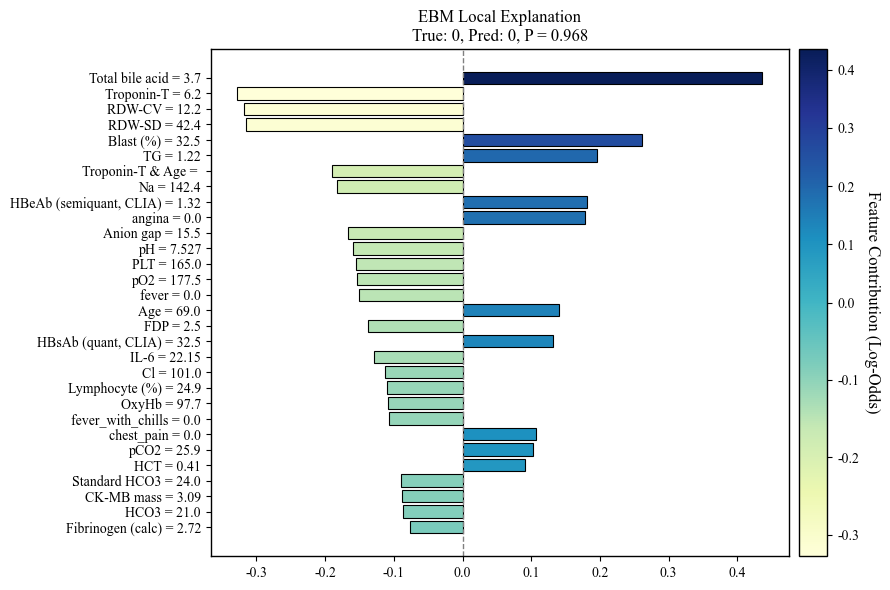

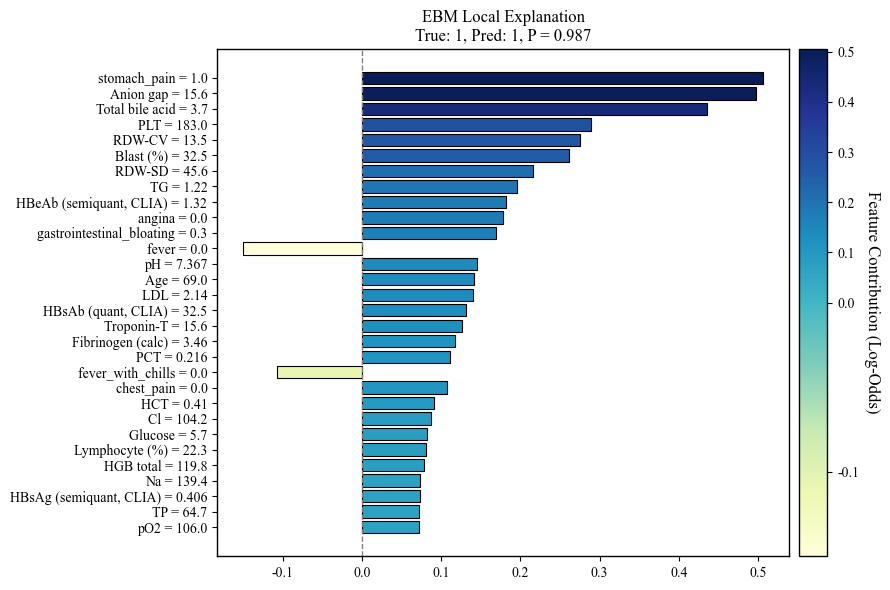

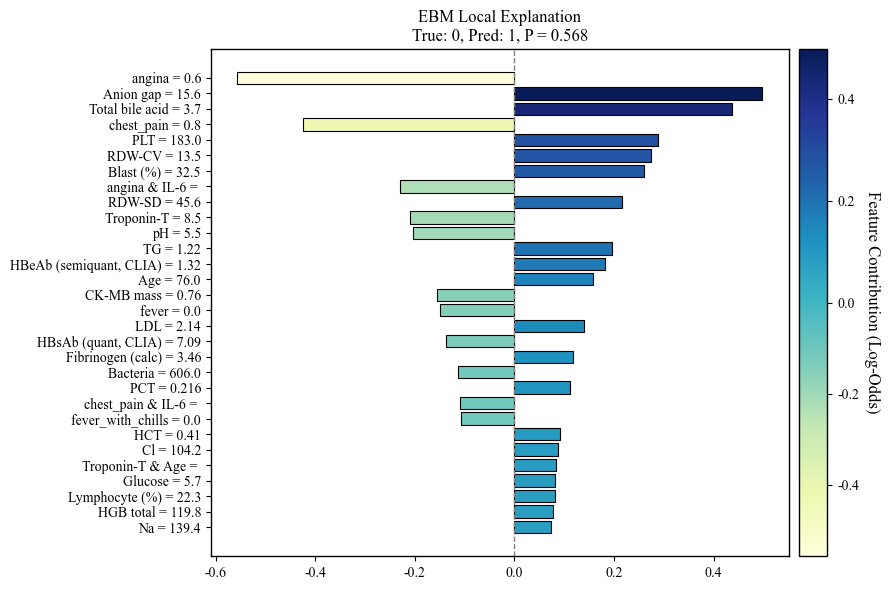

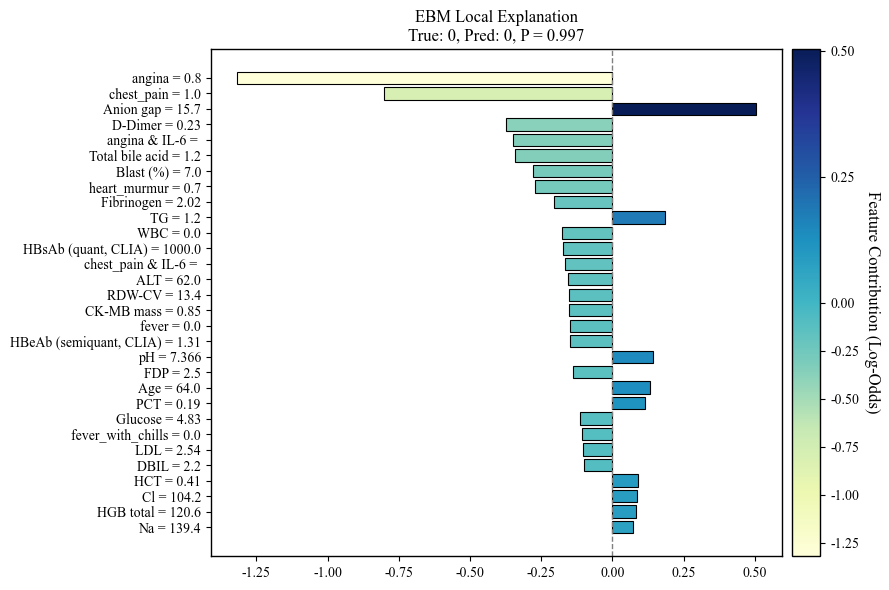

ValueError: vmin, vcenter, and vmax must be in ascending order

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.model_selection import train_test_split

# 设置字体和图形风格（适用于论文）
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.linewidth'] = 1.0
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.direction'] = 'out'
plt.rcParams['axes.unicode_minus'] = False  # 避免负号乱码

# ===========================
# Step 1: 数据预处理
# ===========================
df = pd.read_csv('Data/symptom_scores_all_deepseek-v3-0324.csv')
df2 = pd.read_excel('Data/ICU_BASELINE.xlsx')

# 数值处理
df2['年龄'] = pd.to_numeric(df2['年龄'], errors='coerce')
df2['身高'] = pd.to_numeric(df2['身高'], errors='coerce')
df2['体重'] = pd.to_numeric(df2['体重'], errors='coerce')
df2['BMI'] = df2['体重'] / ((df2['身高'] / 100) ** 2)

# 去除BMI异常值（用中位数填充）
Q1, Q3 = df2['BMI'].quantile([0.25, 0.75])
IQR = Q3 - Q1
lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
median_bmi = df2['BMI'].median()
df2['BMI'] = df2['BMI'].apply(lambda x: median_bmi if x < lower or x > upper else x)

# 性别映射 + 合并
df2.rename(columns={'性别': 'Gender', '年龄': 'Age'}, inplace=True)
df2['Gender'] = df2['Gender'].map({'男': 1, '女': 0})
df = pd.merge(df, df2[['patient_id', 'Gender', 'Age', 'BMI']], on='patient_id', how='left')

# 目标变量 & 特征
y = df['label']
X = df.drop(columns=['label', 'patient_id'])

# ===========================
# Step 2: 模型训练
# ===========================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)
ebm = ExplainableBoostingClassifier(
    interactions=30,
    max_bins=128,
    max_interaction_bins=128,
    random_state=42
)
ebm.fit(X_train, y_train)

# ===========================
# Step 3: 可视化函数定义
# ===========================
def plot_local_ebm(i, ebm_local, cmap='YlGnBu', top_k=30):
    data = ebm_local.data(i)
    names = np.array(data['names'])
    values = np.array(data['values'], dtype=object)
    scores = np.array(data['scores'], dtype=float)
    perf = data['perf']

    # 选择 top_k 特征
    order = np.argsort(np.abs(scores))[::-1][:top_k]
    names_k = names[order]
    values_k = values[order]
    scores_k = scores[order]

    # 创建渐变颜色
    norm = TwoSlopeNorm(vmin=np.min(scores_k), vcenter=0, vmax=np.max(scores_k))
    color_map = sns.color_palette(cmap, as_cmap=True)
    colors = [color_map(norm(s)) for s in scores_k]

    # 绘图
    fig, ax = plt.subplots(figsize=(9, 6))
    bars = ax.barh(np.arange(len(scores_k)), scores_k, color=colors, edgecolor='black', linewidth=0.8)
    ax.set_yticks(np.arange(len(scores_k)))
    ax.set_yticklabels([f"{n} = {v}" for n, v in zip(names_k, values_k)], fontsize=10)
    ax.axvline(0, linestyle='--', color='gray', linewidth=1)
    ax.invert_yaxis()
    
    # 添加颜色条
    sm = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
    sm.set_array([])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label('Feature Contribution (Log-Odds)', rotation=270, labelpad=15)

    # 标题：真实标签、预测标签和概率
    ax.set_title(
        f"EBM Local Explanation\nTrue: {perf['actual']}, Pred: {perf['predicted']}, P = {perf['predicted_score']:.3f}",
        fontsize=12
    )
    plt.tight_layout()
    plt.show()

# ===========================
# Step 4: 绘图展示前 N 个样本
# ===========================
N = 30
X_samples = X_test.iloc[:N]
y_samples = y_test.iloc[:N]
ebm_local = ebm.explain_local(X_samples, y_samples, name='EBM Local Explanation')

for i in range(N):
    plot_local_ebm(i, ebm_local)

### Analysis of CRP Shape Function in Sepsis Prediction Model

1. **Contribution Direction**:
   - **Predominantly Negative** across most of the clinical range (CRP 1-175 mg/L), indicating a *protective effect* (reduced sepsis risk) as CRP increases in this range.
   - **Positive Contribution** at:
     - Very low CRP (1.0 mg/L): Minor risk increase
     - Extremely high CRP (>175 mg/L): Strong risk increase (peak: +0.37 log-odds at 355.5 mg/L)

2. **Clinical Interpretation**:
   - **Counterintuitive Mid-Range Pattern**: The negative association contradicts expectations that CRP elevation should monotonically increase sepsis risk. This suggests:
     - The model may be "penalizing" moderate CRP elevations that lack corroborating sepsis indicators (e.g., without concurrent organ dysfunction/vital sign abnormalities).
     - CRP may serve as a "rule-out" marker in intermediate ranges when other features are equivocal.
   - **Extreme CRP Significance**: Values >175 mg/L become strong independent risk predictors, aligning with clinical knowledge that profoundly elevated CRP indicates severe systemic inflammation/sepsis.
   - **Very Low CRP Signal**: The minimal risk increase at 1 mg/L may reflect:
     - Immunosuppressed states (e.g., liver failure, malnutrition)
     - Early infection before CRP rise
     - Potential data artifacts at measurement extremes

3. **Key Thresholds & Inflection Points**:
   - **Critical Risk Threshold**: 175 mg/L
     - Contributions shift sharply from negative to positive (+0.26 log-odds)
     - Corresponds to clinical practice where CRP >150-200 mg/L triggers sepsis alerts
   - **Maximal Protective Effect**: -0.14 log-odds at 3.2 mg/L (common CRP elevation in non-septic inflammation)
   - **Transition Zones**:
     - 16-20 mg/L: Brief positive spike (potential modeling artifact or subpopulation signal)
     - 100-175 mg/L: Gradual reduction in protective effect (slope change)

### Clinical Significance
- **Actionable Insight**: CRP <175 mg/L should be interpreted cautiously – absence of corroborating clinical signs may actually *lower* sepsis probability in this model.
- **Red Flag**: CRP >175 mg/L becomes a high-risk indicator independent of other features.
- **Validation Need**: The inverse mid-range relationship warrants:
  1) Evaluation for confounding (e.g., prophylactic antibiotics given for elevated CRP)
  2) Subgroup analysis (e.g., immunocompromised patients)
  3) Comparison against gold-standard sepsis markers (lactate, SOFA)

> **Summary**: CRP functions as a J-shaped risk predictor – protective in moderate elevations but strongly predictive at extremes. The 175 mg/L threshold should be prioritized for clinical decision rules.

In [ ]:
import re
import pandas as pd
from scipy.stats import mannwhitneyu
from scipy.stats import chi2_contingency


df = pd.read_excel('Data/ICU_BASELINE.xlsx')
apache = pd.read_csv('Data/apache.csv')
df = pd.merge(df,apache,on='patient_id',how='left')
total_patients = len(df)

# --- 排除年龄小于18岁
df['年龄'] = pd.to_numeric(df['年龄'], errors='coerce')
age_excluded = df[df['年龄'] < 18]
num_age_excluded = len(age_excluded)
df = df[df['年龄'] >= 18]

# --- 排除怀孕或产后患者
pregnancy_keywords = ['妊娠', '产后', '分娩', '怀孕', '早产', '孕']
pattern = '|'.join(pregnancy_keywords)
pregnancy_excluded = df[df['编目所有诊断与编码拼接'].str.contains(pattern, na=False)]
num_pregnancy_excluded = len(pregnancy_excluded)
df = df[~df['编目所有诊断与编码拼接'].str.contains(pattern, na=False)]

def extract_er_diagnosis(text):
    match = re.search(r"门急诊诊断:([^;]*)", text)
    return match.group(1) if match else ""

# 提取字段
df['ER_Diagnosis'] = df['编目所有诊断与编码拼接'].apply(extract_er_diagnosis)

# 标记是否在门急诊诊断中出现“脓毒症”
df['ER_Has_Sepsis'] = df['ER_Diagnosis'].str.contains(r"脓毒|败血|sepsis", case=False, na=False)

# 剔除包含脓毒症关键词的门急诊诊断
sepsis_in_er = df[df['ER_Has_Sepsis']]
num_sepsis_er = len(sepsis_in_er)
# 剔除这部分患者
df = df[~df['ER_Has_Sepsis']]
# 可选：删除中间列
df.drop(columns=['ER_Diagnosis', 'ER_Has_Sepsis'], inplace=True)

sepsis_keywords = ['脓毒', '败血', 'sepsis', 'A41', 'R65', 'A40']  # ICD编码和关键词可自行扩展
sepsis_pattern = '|'.join(sepsis_keywords)

# 找出 label 为空的样本
label_missing = df['label'].isna()

# 应用规则填补 label
df.loc[label_missing & df['编目所有诊断与编码拼接'].str.contains(sepsis_pattern, case=False, na=False), 'label'] = 1
df.loc[label_missing & ~df['编目所有诊断与编码拼接'].str.contains(sepsis_pattern, case=False, na=False), 'label'] = 0

# label 类型强制转换为整数
df['label'] = df['label'].astype(int)
print(f"总患者数: {total_patients}")
print(f"排除年龄小于18岁的患者数: {num_age_excluded}")
print(f"排除怀孕或产后女性的患者数: {num_pregnancy_excluded}")
print(f"门急诊诊断中包含“脓毒症”的患者数量: {num_sepsis_er}")
print(f"最终纳入分析的患者数: {len(df)}")

criteria = {
    "Infection": r"\b(A41|R65|B44|J15|J18|B49)",
    "Circulatory Dysfunction": r"\b(I50|I21|I63|R57|I10|I26|R60)",
    "Hepatic Dysfunction": r"\b(K72|R94\.5|K74|B18|K76|E83\.1)",
    "Renal Dysfunction": r"\b(N17|N19|N18)",
    "Hematologic Abnormalities": r"\b(D65|D68|D64|D69|D70)",
    "Metabolic Disorders": r"\b(E87|E83|E86|E77|E1[0-4])",
    "Neurological Dysfunction": r"\b(R41|G31|G93|I63)",
    "Immune Dysfunction": r"\b(D84|D89|U82)",
    "Malignancy": r"\bC[0-9][0-9](\.[0-9]+)?",
    "Respiratory Dysfunction": r"\b(J96|J44|J81|R09|J90|J80)"
}
# 3. 加入器官功能障碍标签列
for key, pattern in criteria.items():
    df[key] = df["编目所有诊断与编码拼接"].apply(lambda x: bool(re.search(pattern, x)))




# 4. 补充住院时间和 BMI
df['Length of Stay'] = (pd.to_datetime(df['出院日期']) - pd.to_datetime(df['入院时期'])).dt.days
df['身高'] = pd.to_numeric(df['身高'], errors='coerce')
df['体重'] = pd.to_numeric(df['体重'], errors='coerce')
df['BMI'] = df['体重'] / ((df['身高'] / 100) ** 2)
Q1 = df['BMI'].quantile(0.25)
Q3 = df['BMI'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
median_bmi = df['BMI'].median()
df['BMI'] = df['BMI'].apply(lambda x: median_bmi if x < lower_bound or x > upper_bound else x)

df.rename(columns={
    '性别': 'Gender',
    '年龄': 'Age'
}, inplace=True)

# 5. 统计分析函数
def compare_groups_to_csv(df, continuous_variables, categorical_variables, label_col='Label',
                          continuous_outfile='.Data/continuous_results_ICU.csv',
                          categorical_outfile='.Data/categorical_results_ICU.csv'):
    group1 = df[df[label_col] == 0]
    group2 = df[df[label_col] == 1]

    # 连续变量分析
    cont_results = []
    for col in continuous_variables:
        median1 = group1[col].median()
        q1_1 = group1[col].quantile(0.25)
        q3_1 = group1[col].quantile(0.75)

        median2 = group2[col].median()
        q1_2 = group2[col].quantile(0.25)
        q3_2 = group2[col].quantile(0.75)

        stat, p = mannwhitneyu(group1[col].dropna(), group2[col].dropna(), alternative='two-sided')

        cont_results.append({
            'Variable': col,
            'Group0_Median': round(median1, 2),
            'Group0_IQR': f"{q1_1:.2f}-{q3_1:.2f}",
            'Group1_Median': round(median2, 2),
            'Group1_IQR': f"{q1_2:.2f}-{q3_2:.2f}",
            'p-value': round(p, 4)
        })

    pd.DataFrame(cont_results).to_csv(continuous_outfile, index=False)

    # 分类变量分析
    cat_results = []
    for col in categorical_variables:
        contingency = pd.crosstab(df[col], df[label_col])
        chi2, p, dof, expected = chi2_contingency(contingency)

        for level in contingency.index:
            count0 = contingency.loc[level, 0] if 0 in contingency.columns else 0
            count1 = contingency.loc[level, 1] if 1 in contingency.columns else 0
            total0 = group1.shape[0]
            total1 = group2.shape[0]

            cat_results.append({
                'Variable': col,
                'Level': level,
                'Group0_Count': count0,
                'Group0_Percent': f"{(count0 / total0 * 100):.1f}%",
                'Group1_Count': count1,
                'Group1_Percent': f"{(count1 / total1 * 100):.1f}%",
                'p-value': round(p, 4) if level == contingency.index[0] else ""
            })

    pd.DataFrame(cat_results).to_csv(categorical_outfile, index=False)
    print(f"Continuous results saved to: {continuous_outfile}")
    print(f"Categorical results saved to: {categorical_outfile}")

# 6. 分析变量并执行
categorical_variables = list(criteria.keys()) + ['Gender']
continuous_variables = ['Age', 'BMI', 'Length of Stay','apache']

compare_groups_to_csv(
    df,
    continuous_variables,
    categorical_variables,
    label_col='label',
    continuous_outfile='./Data/continuous_results_ICU.csv',
    categorical_outfile='./Data/categorical_results_ICU.csv'
)